# LIBRARIES

In [1]:
import os
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices=false'

In [1]:
! pip install pandas keras matplotlib numpy tensorflow scikit-learn seaborn


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: C:\Program Files\Python310\python.exe -m pip install --upgrade pip


In [ ]:
import pandas as pd
import keras
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras import mixed_precision
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import seaborn as sns
import os


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: C:\Program Files\Python310\python.exe -m pip install --upgrade pip


# DATA

A polyp is an abnormal growth of tissue projecting from a mucous membrane.
While colon polyps are not commonly associated with symptoms, occasionally they may cause rectal bleeding, and on rare occasions pain, diarrhea or constipation.
They are a concern because of the potential for colon cancer being present microscopically, and the risk of benign colon polyps becoming malignant over time.
(Wikipedia)


**Modalities**

* BLI: Blue Light Imaging concentrates and intensifies specific wave lengths of light, resulting in a better visualisation of the superficial microvessel
  
* FICE: Flexible spectral Imaging Color Enhancement, is a virtual chromoendoscopy technology developed by Fujinon
 
* LCI: Linked Color Imaging uses a combination of white light and short-wavelength band laser light to create bright images with high color contrast

* NBI: Narrow Band Imaging endoscopy, is an advanced endoscopic technique that uses specific blue and green light wavelengths to enhance the visibility of mucosal and vascular patterns

* WLI: White Light Imaging endoscopy, is the standard
  

In [3]:
def show_img_mod(mod):
    path = f'/kaggle/input/polypdb/PolypDB/PolypDB/PolypDB_modality_wise/{mod}/images'
    image_files = [f for f in os.listdir(path)]
    img_path = os.path.join(path, image_files[0])
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)  
    img = tf.image.resize(img, (224, 224))  
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img.numpy().astype("uint8"))
    plt.title(mod)
    plt.axis('off')
    plt.show()

I0000 00:00:1761045109.936741      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1761045109.937470      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


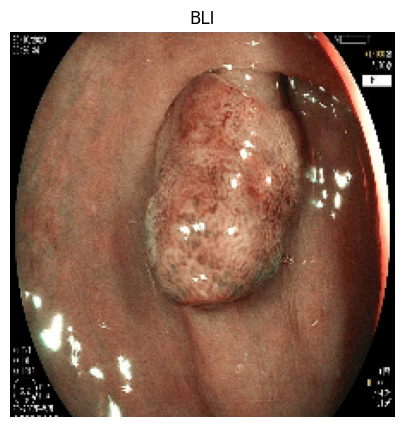

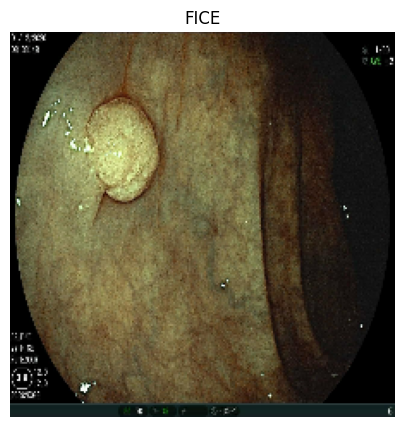

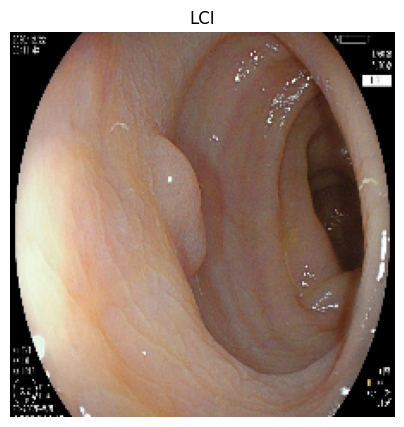

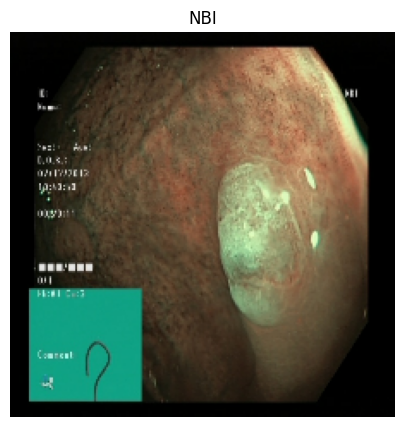

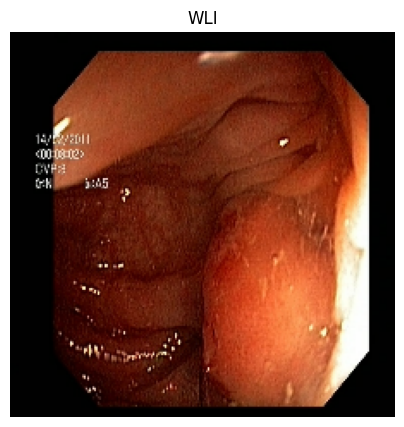

In [4]:
modalities = ['BLI', 'FICE', 'LCI', 'NBI', 'WLI']

for mod in modalities:
    show_img_mod(mod)

**Dataset with masks**

In [5]:
# Image and mask loader function
def load_image_mask_binary(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, (224, 224), method='nearest')
    mask = tf.cast(mask, tf.uint8)
    mask = tf.where(mask > 0, 1, 0)  # binary: 0 or 1
    mask = tf.cast(mask, tf.float32)
    image.set_shape([224, 224, 3])
    mask.set_shape([224, 224, 1])
    return image, mask

# Create tf.data.Dataset
def create_dataset(image_paths, mask_paths, batch_size=8):  #32
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_mask_binary, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [6]:
all_image_paths = []
all_mask_paths = []

for i in modalities:
    image_train_dir = f'/kaggle/input/polypdb/PolypDB/PolypDB/PolypDB_modality_wise/{i}/images'
    mask_train_dir = f'/kaggle/input/polypdb/PolypDB/PolypDB/PolypDB_modality_wise/{i}/masks'
    image_paths = sorted([os.path.join(image_train_dir, fname) for fname in os.listdir(image_train_dir)])
    mask_paths = sorted([os.path.join(mask_train_dir, fname) for fname in os.listdir(mask_train_dir)])
    all_image_paths.extend(image_paths)
    all_mask_paths.extend(mask_paths)

#(80/20 split)
all_image_paths = np.array(all_image_paths)
all_mask_paths = np.array(all_mask_paths)
train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(
    all_image_paths, all_mask_paths,
    test_size=0.2, random_state=42
)


mask_train_dataset = create_dataset(train_img_paths, train_mask_paths, batch_size=32)
mask_val_dataset = create_dataset(val_img_paths, val_mask_paths, batch_size=32)

print(f"Total images: {len(all_image_paths)}")
print(f"Train images: {len(train_img_paths)}")
print(f"Validation images: {len(val_img_paths)}")

Total images: 3934
Train images: 3147
Validation images: 787


**Display images with their masks**

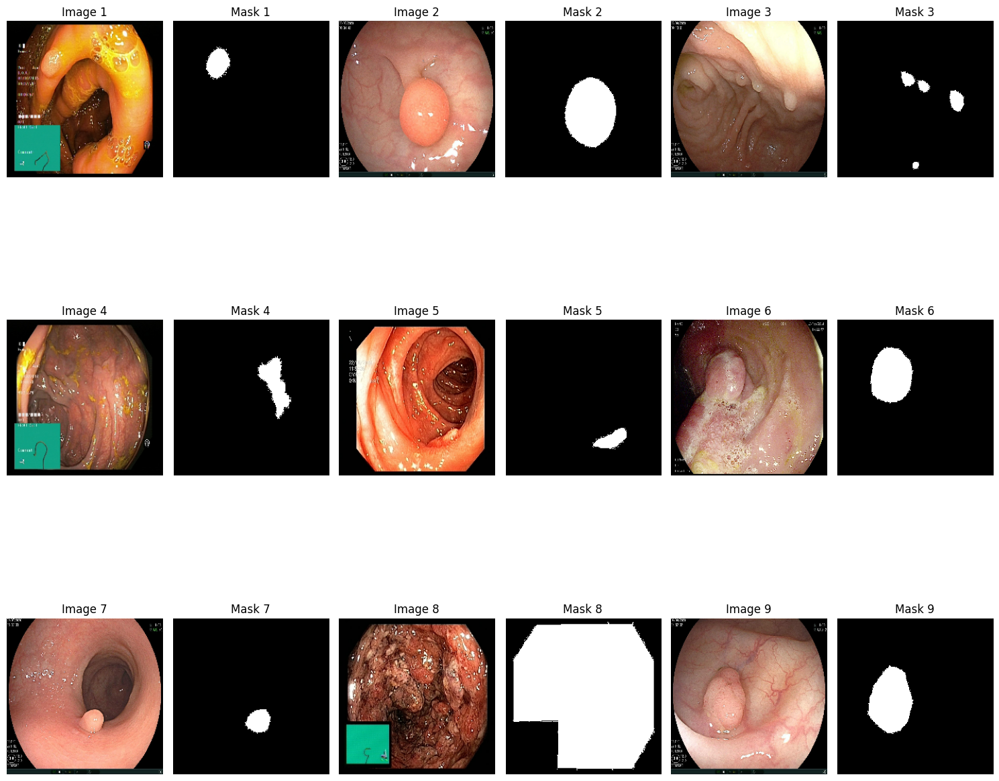

In [7]:
#if n² images -> ax = plt.subplot(n, 2n, 2*i + 1)

for image_batch, mask_batch in mask_train_dataset.take(1):
    
    plt.figure(figsize=(15, 15))

    for i in range(9):
        image = image_batch[i].numpy()
        mask = mask_batch[i].numpy().squeeze()   
        ax = plt.subplot(3, 6, 2*i + 1)  #3 rows 6 columns, imgs in odd positions
        ax.imshow(image)
        ax.set_title(f'Image {i+1}')
        ax.axis('off')
        ax = plt.subplot(3, 6, 2*i + 2) #3 rows 6 columns, masks in even positions
        ax.imshow(mask, cmap='gray') #white on black
        ax.set_title(f'Mask {i+1}')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

**Data augmentation**

In [8]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.05),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
])

# MODEL

**U-NET:** It follows an encoder-decoder structure: the encoder captures high-level features by downsampling, while the decoder reconstructs the image back to its original size using upsampling. A key feature of U-Net is its skip connections, which pass low-level features from the encoder directly to the decoder, preserving spatial details.

In [9]:
#speed things up
mixed_precision.set_global_policy('mixed_float16')

In [10]:
def conv_block(x, filters, dropout=0.0):
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    if dropout > 0.0:
        x = layers.Dropout(dropout)(x)
    
    return x

def unet_binary(input_shape=(224, 224, 3)):
    inputs = layers.Input(shape=input_shape)
    augmented_inputs = data_augmentation(inputs)

    # Encoder
    c1 = conv_block(inputs, 64)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256, dropout=0.3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # Bottleneck
    bn = conv_block(p3, 512, dropout=0.5)

    # Decoder
    u3 = layers.UpSampling2D((2, 2))(bn)
    u3 = layers.Concatenate()([u3, c3])
    c6 = conv_block(u3, 256)

    u2 = layers.UpSampling2D((2, 2))(c6)
    u2 = layers.Concatenate()([u2, c2])
    c7 = conv_block(u2, 128)

    u1 = layers.UpSampling2D((2, 2))(c7)
    u1 = layers.Concatenate()([u1, c1])
    c8 = conv_block(u1, 64)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid', dtype='float32')(c8)

    return models.Model(inputs, outputs)

**Evalaution parameters**

* Dice coefficient: overlap between sets  1=perfect match  0=no match
* Dice loss: opposite of coefficient (1- dice coefficient)
* Focal loss: downweight easy examples and focus more on hard-to-classify ones, making it effective for imbalanced data
* IoU metric: overlap between two sets

In [11]:
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(y_true, y_pred)

def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        epsilon = 1e-7
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        
        cross_entropy = -y_true * tf.math.log(y_pred) - (1 - y_true) * tf.math.log(1 - y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma) * y_true + \
                 (1 - alpha) * tf.pow(y_pred, gamma) * (1 - y_true)
        return tf.reduce_mean(weight * cross_entropy)
    return focal_loss_fixed

def combo_loss(y_true, y_pred):
    return 0.5 * focal_loss()(y_true, y_pred) + 0.5 * dice_loss(y_true, y_pred)

# Thresholded metrics (for evaluation)
def dice_metric(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    return dice_coefficient(y_true, y_pred)

def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

**Training**

In [12]:
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))
with strategy.scope():
    model_seg = unet_binary()
    model_seg.compile(
        optimizer='adam',
        loss=combo_loss,
        metrics=[dice_metric, iou_metric, 'accuracy']
    )


    early_stopping = EarlyStopping(
    monitor='val_dice_metric',   # Dice detecting the object    IoU overall segmenation
    patience=5,                  # Stop after 5 epochs of no improvement
    restore_best_weights=True,
    mode='max',
    verbose=1                    
)
    
    history = model_seg.fit(
        mask_train_dataset,
        validation_data=mask_val_dataset,
        epochs=20, #5 speed,
        callbacks=[early_stopping]
    )

Number of devices: 2
Epoch 1/20


I0000 00:00:1761045134.624728      60 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1761045135.656601      59 cuda_dnn.cc:529] Loaded cuDNN version 90300


99/99 ━━━━━━━━━━━━━━━━━━━━ 89s 672ms/step - accuracy: 0.5428 - dice_metric: 0.1895 - iou_metric: 0.1069 - loss: 1.0417 - val_accuracy: 0.9169 - val_dice_metric: 1.5935e-11 - val_iou_metric: 1.5935e-11 - val_loss: 1.1447
Epoch 2/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 68s 682ms/step - accuracy: 0.8682 - dice_metric: 0.3057 - iou_metric: 0.1837 - loss: 0.7934 - val_accuracy: 0.9149 - val_dice_metric: 0.0036 - val_iou_metric: 0.0018 - val_loss: 1.0023
Epoch 3/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 71s 714ms/step - accuracy: 0.8586 - dice_metric: 0.3225 - iou_metric: 0.1949 - loss: 0.8076 - val_accuracy: 0.9029 - val_dice_metric: 0.1140 - val_iou_metric: 0.0610 - val_loss: 0.9687
Epoch 4/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 71s 713ms/step - accuracy: 0.8709 - dice_metric: 0.3480 - iou_metric: 0.2150 - loss: 0.7767 - val_accuracy: 0.8212 - val_dice_metric: 0.3221 - val_iou_metric: 0.1922 - val_loss: 0.8317
Epoch 5/20
99/99 ━━━━━━━━━━━━━━━━━━━━ 70s 701ms/step - accuracy: 0.8881 - dice_metric: 0.3954 - iou_metric: 0.2

In [13]:
def visualize_raw_prediction(image, true_mask, pred_mask):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title("Input Image")
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(true_mask[:, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Predicted Mask (Raw probabilities of tumor)")
    plt.imshow(pred_mask[:, :, 0], cmap='gray')  # No thresholding here
    plt.colorbar() 
    plt.axis('off')

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


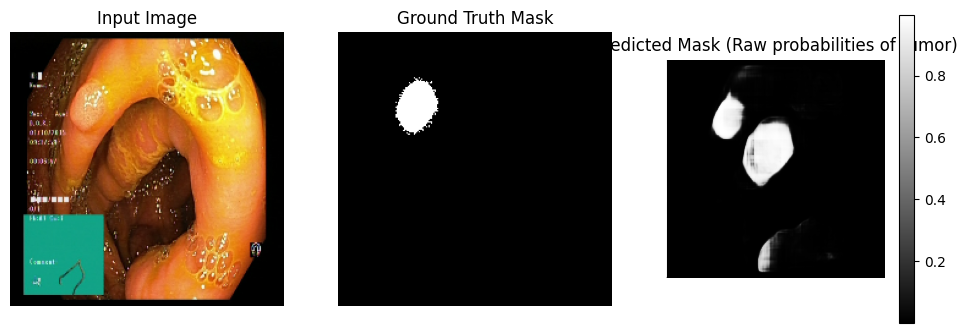

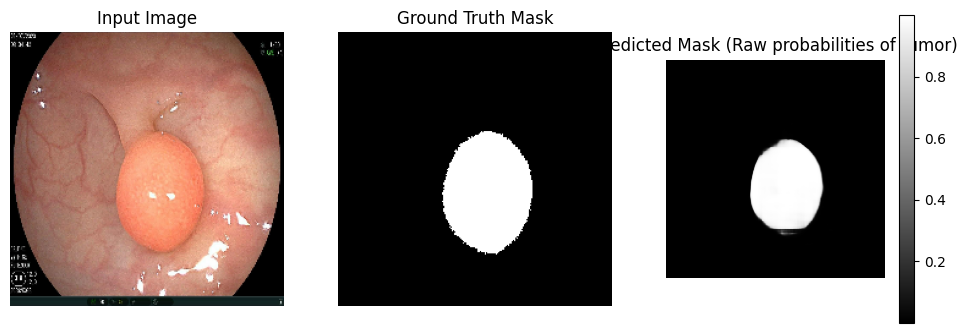

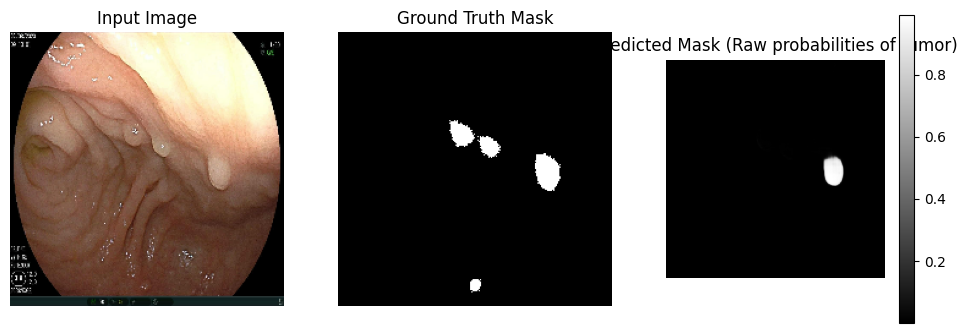

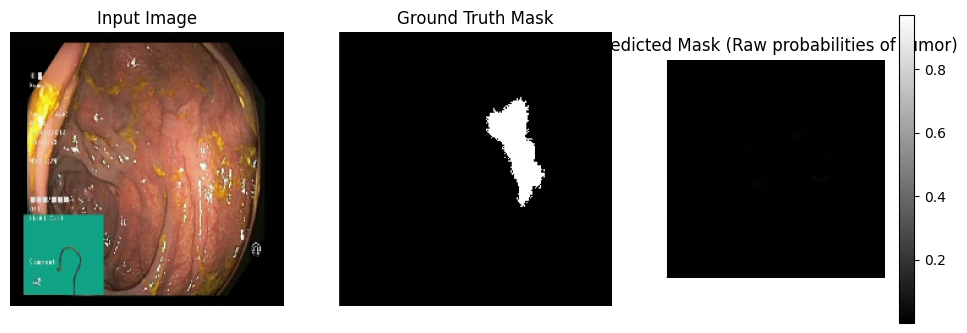

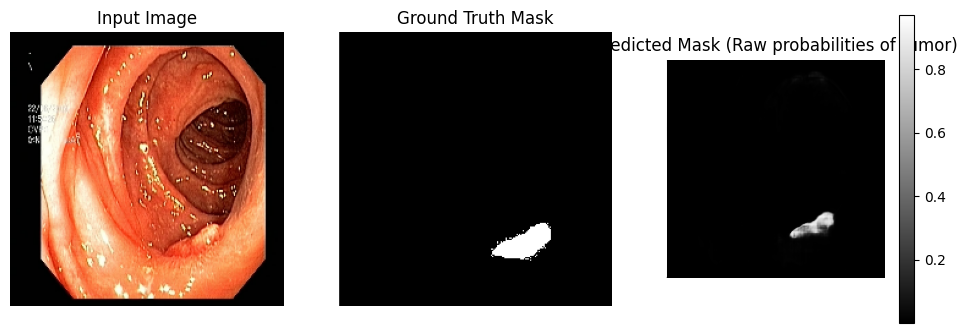

...

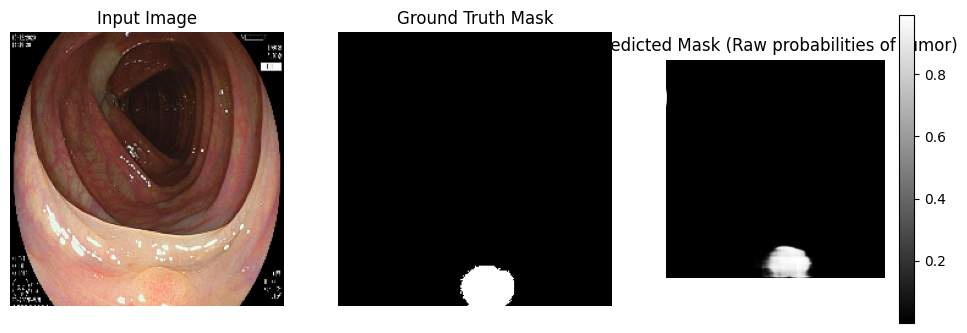

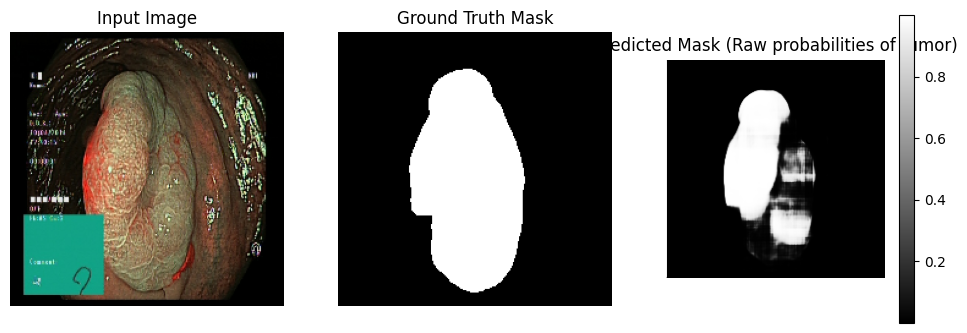

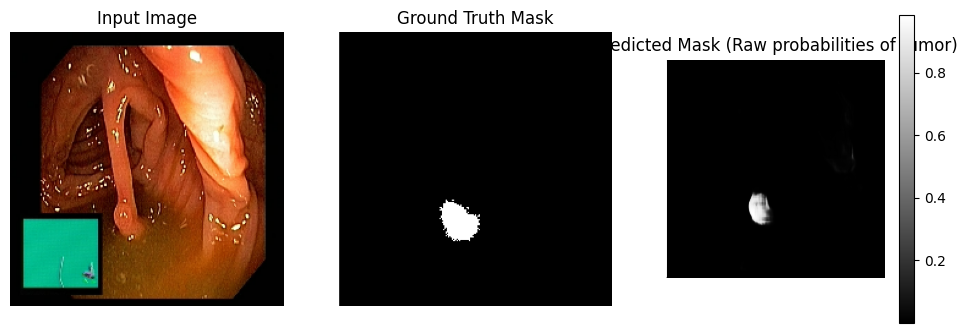

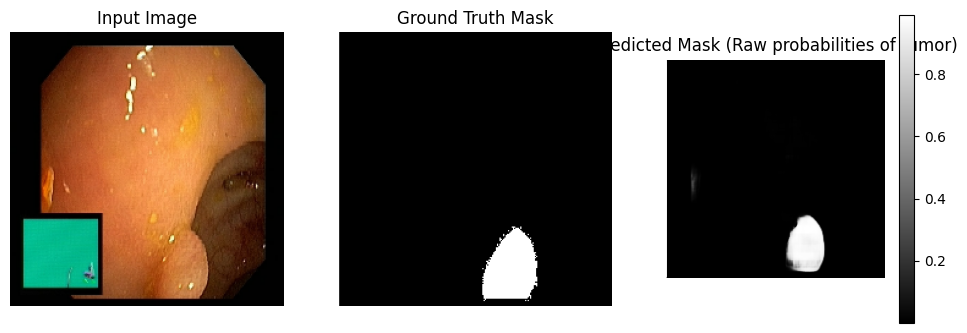

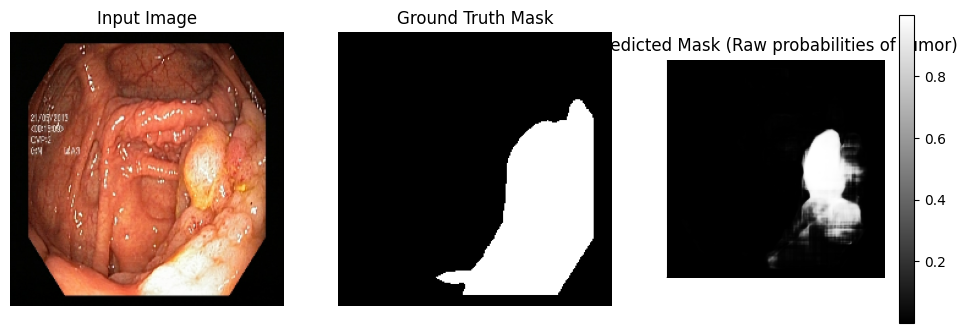

In [14]:
for images, masks in mask_train_dataset.take(1):  # Take one batch
    preds = model_seg.predict(images)
    for i in range(len(images)):
        visualize_raw_prediction(
            images[i].numpy(), 
            masks[i].numpy(), 
            preds[i]
        )

**Mask for a new image**

In [15]:
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)  # or decode_jpeg
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0
    image.set_shape([224, 224, 3])
    return image

def predict_mask(model, image_path, threshold=0.5):
    image = preprocess_image(image_path)
    input_tensor = tf.expand_dims(image, axis=0)  # shape: (1, 224, 224, 3)

    prediction = model_seg.predict(input_tensor)
    prediction = prediction[0]  # remove batch dimension

    if len(prediction.shape) == 2:
        prediction = np.expand_dims(prediction, axis=-1)

    binary_mask = (prediction > threshold).astype(np.uint8)
    return image.numpy(), prediction, binary_mask

def show_image_and_mask(image, prediction, binary_mask):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(prediction[:, :, 0], cmap='gray')
    plt.title('Predicted Mask (Raw)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(binary_mask[:, :, 0], cmap='gray')
    plt.title('Binary Mask (Thresholded)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


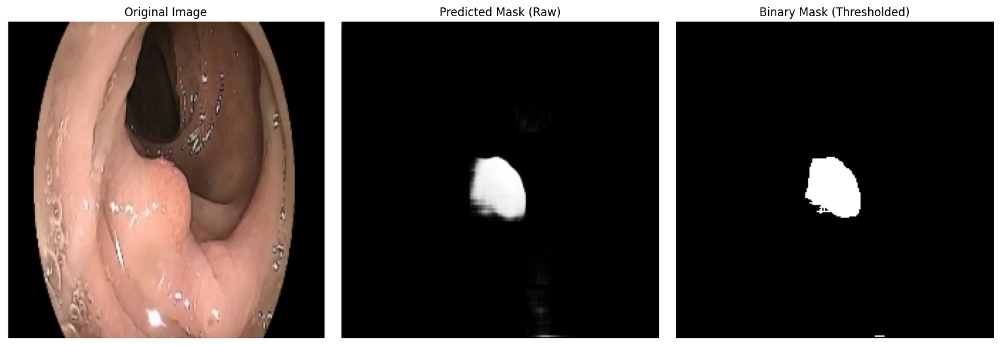

In [16]:
external_image_path = '/kaggle/input/colon-polyp/Screenshot 2025-10-12 at 16-58-47 Trainees May Miss More Sessile Serrated Polyps on Colonoscopy MedPage Today.png'
image, raw_pred, binary_pred = predict_mask(model_seg, external_image_path)
show_image_and_mask(image, raw_pred, binary_pred)

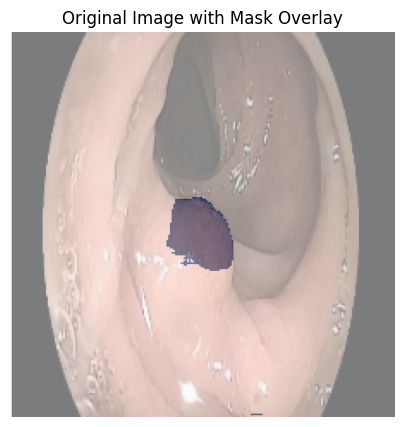

In [17]:
def show_mask_overlay(image, prediction, binary_mask):
    plt.figure(figsize=(15, 5))
    plt.imshow(image)
    plt.imshow(binary_mask[:, :, 0], cmap='Blues', alpha=0.5)  # Change alpha for transparency
    plt.title('Original Image with Mask Overlay')
    plt.axis('off')
    plt.show()

show_mask_overlay(image, raw_pred, binary_pred)